In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
import geopandas as gpd

Read in the data

In [2]:
baseline = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=3)
health_facilities = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=5)
prices = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=6)
incidents = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=7)
humidx = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=8)
refugees = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=9)
food = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=10)
mat = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=11)
health = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=12)
priorities = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=13)
wash = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=14)
vgroups = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=15)
schools = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=16)
incomes = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=17)
access = pd.read_excel('datasets/acaps_2021.xlsx', sheet_name=19)

Log info on temporal resolution and key variables

In [3]:
baseline_idx = ['District Pcode', 
                'UNOCHA Operational Hub',
                'Gov', 
                'District']
baseline_level = 'general'

general_idx = ['District Pcode', 
          'UNOCHA Operational Hub',
          'Governorate', 'District']
hf_level = 'monthly' #no2019
prices_level = 'monthly'
inc_level = 'monthly'
humidx_level = 'monthly'
refugees_idx = ['Governorate PCODE', 'Governorate']
refugees_level = 'monthly' #no2019, early 2021 only
food_level = 'few days' # 2021 only
mat_level = 'monthly'
health_level = 'monthly'
priorities_level = 'monthly'
wash_level = 'monthly'
vgroups_level = 'monthly'
schools_level = 'monthly'
incomes_level = 'monthly'
access_level = 'monthly'

complete_datasets = [prices, incidents, humidx, mat,
                     health, priorities, wash, vgroups, 
                     schools, incomes, access]
prefixes = ['prices', 'incidents', 'hum', 'mat',
            'health', 'priorities', 
            'wash', 'vgroup', 'schools', 
            'incomes', 'access']


Log variable names per group in a dictionary

In [4]:
vdict = {}
for idx, cd in enumerate(complete_datasets):
    cd = cd.drop('SN', axis=1)
    vdict[prefixes[idx]] = list(set(cd.columns) - set(general_idx + ['Date']))
    if idx == 0:
        merged = cd
    else:
        merged = merged.merge(cd, on=general_idx + ['Date'])

Compute some metrics of data completeness

In [5]:
# Compute number of districts defined at all months
complete = merged.groupby(['Date', 'District']).Governorate.count().reset_index().groupby('District').Date.count()
print('Number of districts defined at all months')
print((complete == 25).sum() / complete.shape[0])

# Number of governorates with at least one district defined in all months
govt_per_month = merged.groupby(['Date', 'Governorate'])['District'].count()
govt_per_month = govt_per_month.reset_index().groupby('Governorate')['Date'].count().reset_index()
print('Number of governorates with one district defined at all months')
print((govt_per_month['Date'] == 25).sum() / govt_per_month.shape[0])


Number of districts defined at all months
0.4092827004219409
Number of governorates with one district defined at all months
0.5172413793103449


Merge with baseline data on districts

In [6]:
merged = merged.merge(baseline.drop('SN', axis=1), left_on=['District Pcode',                                                             'UNOCHA Operational Hub',
                                                            'Governorate', 'District'],
                                                   right_on=['District Pcode', 
                                                            'UNOCHA Operational Hub',
                                                            'Gov', 'District'])
vdict['baseline'] = list(set(baseline.drop('SN', axis=1).columns) - set(general_idx + ['Date']))


Do some formatting and compute rates (cases / population) for cholera

In [7]:
# Do some formatting
merged['Date'] = pd.to_datetime(merged['Date'])
merged['Governorate'] = merged['Governorate'].astype(str)
merged['District'] = merged['District'].astype(str)
merged['%Attack rate '] = merged['%Attack rate '].astype(float, errors='ignore')

# Compute overall attack rate
merged['# of deaths - cholera'] = merged['# of deaths - cholera'].astype(float)
merged['cholera_rate'] = (merged['# of suspected cases - cholera'] / merged['Total Estimated Population 2020 (HNO)_y']).astype(float)
merged['cholera_death_rate'] = (merged['# of deaths - cholera'] / merged['Total Estimated Population 2020 (HNO)_y']).astype(float)


### Look at merged data

In [ ]:
# Rename districts and re-aggregate
# Find out why we have population issues aggregating stuff?

In [52]:
complete_district = complete[complete==25].index.tolist()

In [63]:
merged_complete_only = merged[merged['District'].isin(complete_district)]
merged_complete_only = merged_complete_only[['Governorate', 'District', 'Date',
                                             '# of suspected cases - cholera',
                                             '# of deaths - cholera',
                                             'Total Estimated Population 2020 (HNO)_y']]
by_district = merged_complete_only.rename({'Total Estimated Population 2020 (HNO)_y': 'Population (HNO 2020)'}, axis=1)

In [64]:
by_governorate = merged_complete_only.groupby(['Date', 'Governorate']).agg({'# of suspected cases - cholera': 'sum', '# of deaths - cholera': 'sum', 'Total Estimated Population 2020 (HNO)_y': 'sum'}).reset_index()
by_governorate = by_governorate.rename({'Total Estimated Population 2020 (HNO)_y': 'Population (HNO 2020)'}, axis=1)

In [65]:
national_level = merged_complete_only.groupby(['Date']).agg({'# of suspected cases - cholera': 'sum', '# of deaths - cholera': 'sum', 'Total Estimated Population 2020 (HNO)_y': 'sum'}).reset_index()
national_level = national_level.rename({'Total Estimated Population 2020 (HNO)_y': 'Population (HNO 2020)'}, axis=1)

In [70]:
for g in by_governorate['Governorate'].unique():
    print(by_governorate[by_governorate['Governorate'] == g].shape)
    #['Population (HNO 2020)'].

(25, 5)
(25, 5)
(25, 5)
(12, 5)
(25, 5)
(12, 5)
(25, 5)
(25, 5)
(12, 5)
(25, 5)
(25, 5)
(12, 5)
(25, 5)
(25, 5)
(13, 5)
(13, 5)
(13, 5)
(13, 5)
(13, 5)


### Aggregates by region
Compute number of cases and cases/population by district and governorate

In [36]:
dabs = merged.groupby('District')['# of deaths - cholera'].sum().reset_index()
cabs = merged.groupby('District')['# of suspected cases - cholera'].sum().reset_index()
dabs_gvt = merged.groupby('Governorate')['# of deaths - cholera'].sum().reset_index()
cabs_gvt = merged.groupby('Governorate')['# of suspected cases - cholera'].sum().reset_index()


### Deaths by district
Number of deaths by district

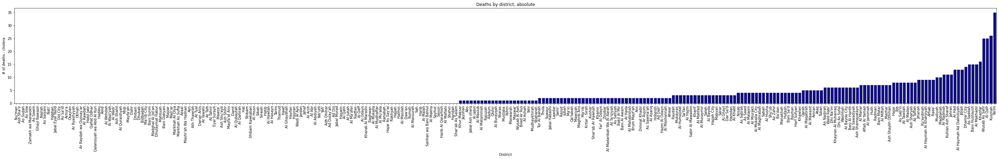

In [37]:
fig, ax = plt.subplots(figsize=(50,5))
sns.barplot(data=dabs.sort_values(by='# of deaths - cholera'), 
            x='District', y='# of deaths - cholera', color='darkblue')
plt.xticks(rotation=90)
plt.title('Deaths by district, absolute')
plt.show()

### Cases by district
Plot umber of cases by district

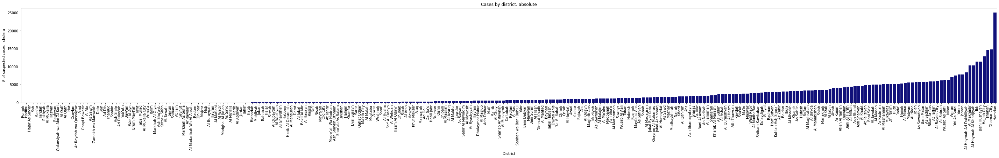

In [38]:
# Plot absolute c, districts
fig, ax = plt.subplots(figsize=(50,5))
sns.barplot(data=cabs.sort_values(by='# of suspected cases - cholera'), 
            x='District', y='# of suspected cases - cholera', color='darkblue')
plt.xticks(rotation=90)
plt.title('Cases by district, absolute')
plt.show()

### Deaths and cases by governorate
Number of deaths by governorate

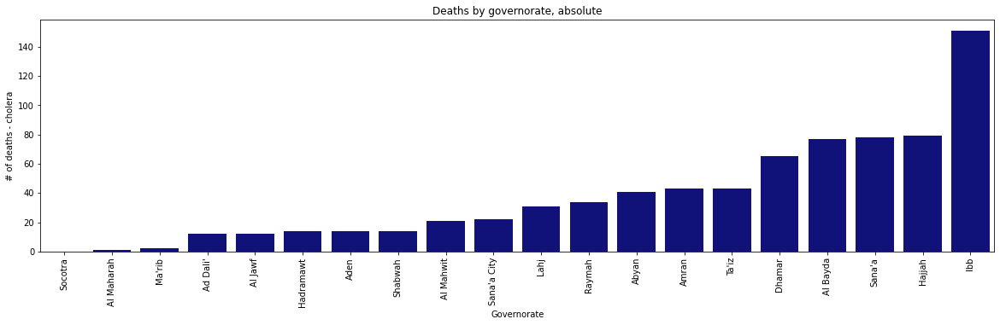

In [39]:
# Plot absolute d, govt
fig, ax = plt.subplots(figsize=(20,5))
sns.barplot(data=dabs_gvt.sort_values(by='# of deaths - cholera'), 
            x='Governorate', y='# of deaths - cholera', color='darkblue')
plt.xticks(rotation=90)
plt.title('Deaths by governorate, absolute')
plt.show()


Number of cases by governorate

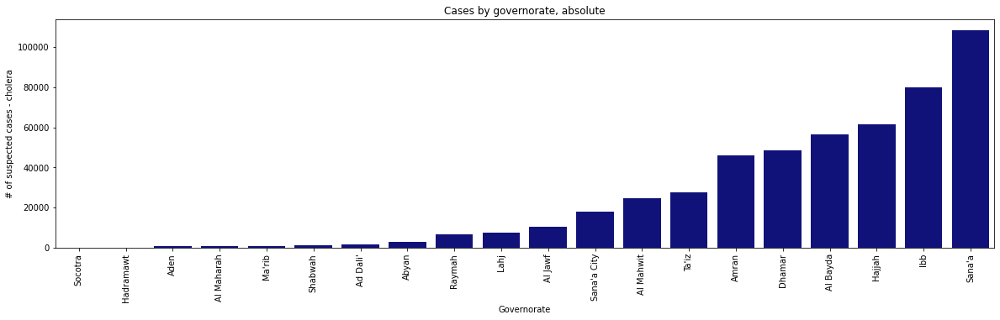

In [40]:
# Plot absolute c, govt
fig, ax = plt.subplots(figsize=(20,5))
sns.barplot(data=cabs_gvt.sort_values(by='# of suspected cases - cholera'), 
            x='Governorate', y='# of suspected cases - cholera', color='darkblue')
plt.xticks(rotation=90)
plt.title('Cases by governorate, absolute')
plt.show()

### Same data as rates (cases or deaths over population)

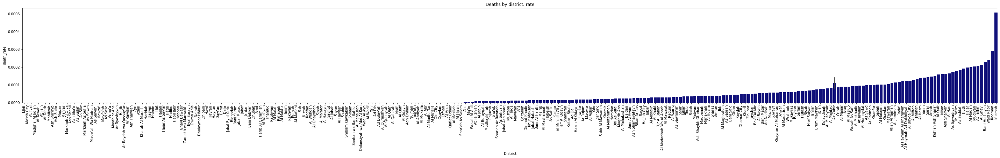

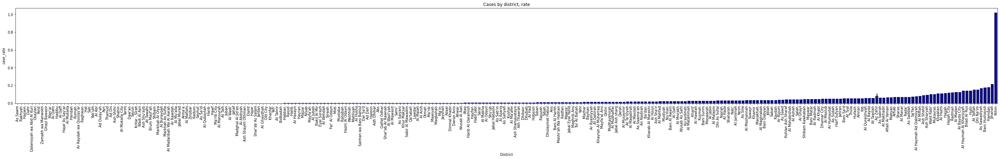

In [41]:
# Get district relative
dabs = dabs.merge(baseline[['District', 'Total Estimated Population 2020 (HNO)']])
dabs['death_rate'] = dabs['# of deaths - cholera'] / dabs['Total Estimated Population 2020 (HNO)']
cabs = cabs.merge(baseline[['District', 'Total Estimated Population 2020 (HNO)']])
cabs['case_rate'] = cabs['# of suspected cases - cholera'] / cabs['Total Estimated Population 2020 (HNO)']

# Plot absolute d, districts
fig, ax = plt.subplots(figsize=(50,5))
sns.barplot(data=dabs.sort_values(by='death_rate'), 
            x='District', y='death_rate', color='darkblue')
plt.xticks(rotation=90)
plt.title('Deaths by district, rate')
plt.show()

# Plot absolute d, districts
fig, ax = plt.subplots(figsize=(50,5))
sns.barplot(data=cabs.sort_values(by='case_rate'), 
            x='District', y='case_rate', color='darkblue')
plt.xticks(rotation=90)
plt.title('Cases by district, rate')
plt.show()

In [42]:
dabs_gvt = dabs_gvt.merge(baseline[['Gov', 'Total Estimated Population 2020 (HNO)']].groupby('Gov').sum().reset_index(),
                          left_on='Governorate', right_on='Gov').drop('Gov', axis=1)
dabs_gvt['death_rate'] = dabs_gvt['# of deaths - cholera'] / dabs_gvt['Total Estimated Population 2020 (HNO)']
cabs_gvt = cabs_gvt.merge(baseline[['Gov', 'Total Estimated Population 2020 (HNO)']].groupby('Gov').sum().reset_index(),
                          left_on='Governorate', right_on='Gov').drop('Gov', axis=1)
cabs_gvt['case_rate'] = cabs_gvt['# of suspected cases - cholera'] / cabs_gvt['Total Estimated Population 2020 (HNO)']


#### By governorate

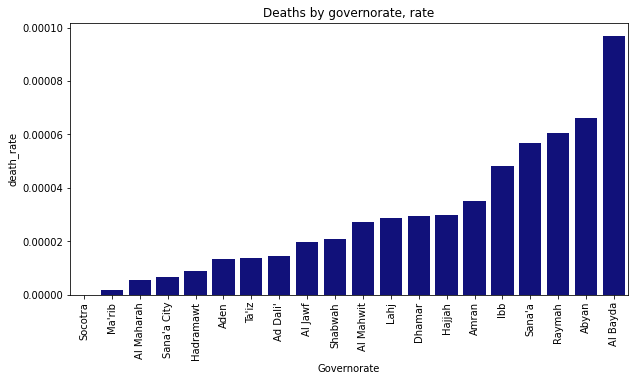

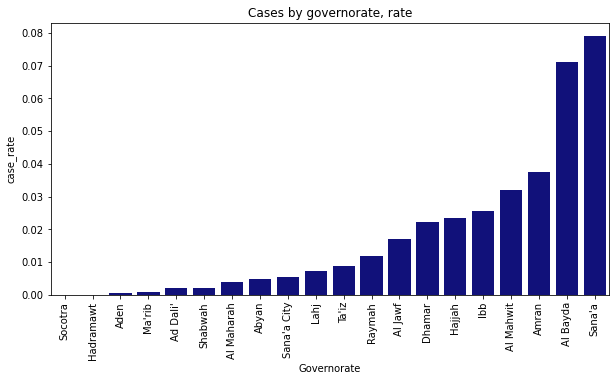

In [43]:
# Plot rate d, gvt
fig, ax = plt.subplots(figsize=(10,5))
sns.barplot(data=dabs_gvt.sort_values(by='death_rate'), 
            x='Governorate', y='death_rate', color='darkblue')
plt.xticks(rotation=90)
plt.title('Deaths by governorate, rate')
plt.show()

# Plot rate C, gvt
fig, ax = plt.subplots(figsize=(10,5))
sns.barplot(data=cabs_gvt.sort_values(by='case_rate'), 
            x='Governorate', y='case_rate', color='darkblue')
plt.xticks(rotation=90)
plt.title('Cases by governorate, rate')
plt.show()


### Display on map (governorate-level data)

# deaths
('Ibb', 151.)
Deaths per population unit
('Al Bayda', 9.68423118e-05)
# cases
("Sana'a", 108452)
Cases per population unit
("Sana'a", 0.07911598)


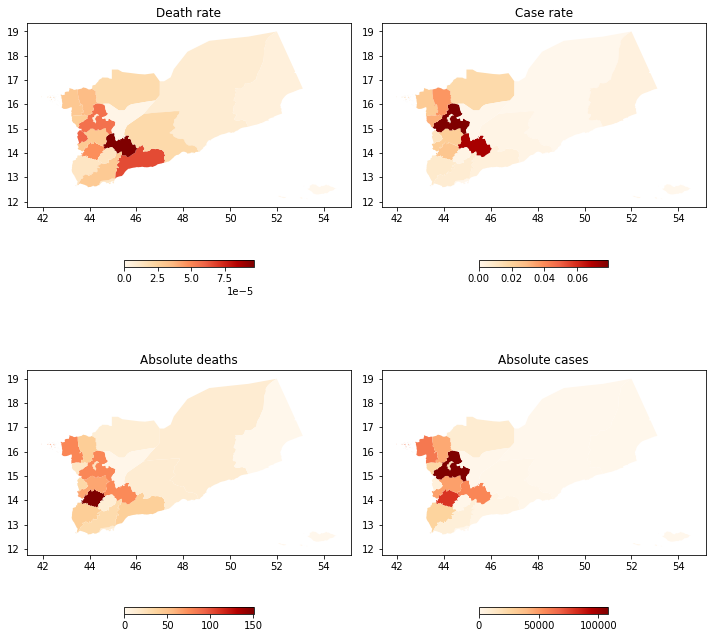

In [44]:
# Plot these on a map
gvt_gdata = gpd.read_file('yem-administrative-divisions-shapefiles/yem_admbnda_adm1_govyem_cso_20191002.shp')
ds_gdata = gpd.read_file('yem-administrative-divisions-shapefiles/yem_admbnda_adm2_govyem_cso_20191002.shp')

# Viz top
print('# deaths')
print(dabs_gvt[dabs_gvt['# of deaths - cholera'] == dabs_gvt['# of deaths - cholera'].max()][['Governorate', '# of deaths - cholera']].to_records(index=False)[0])
print('Deaths per population unit')
print(dabs_gvt[dabs_gvt['death_rate'] == dabs_gvt['death_rate'].max()][['Governorate', 'death_rate']].to_records(index=False)[0])
print('# cases')
print(cabs_gvt[cabs_gvt['# of suspected cases - cholera'] == cabs_gvt['# of suspected cases - cholera'].max()][['Governorate', '# of suspected cases - cholera']].to_records(index=False)[0])
print('Cases per population unit')
print(cabs_gvt[cabs_gvt['case_rate'] == cabs_gvt['case_rate'].max()][['Governorate', 'case_rate']].to_records(index=False)[0])

# Plot maps
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10,10))
gvt_gdata.merge(dabs_gvt[['Governorate', 'death_rate']], 
                left_on='ADM1_EN', 
                right_on='Governorate').drop('Governorate', 
                                             axis=1).plot(column='death_rate', 
                                                          cmap='OrRd', ax=ax[0,0], 
                                                          legend=True, legend_kwds={'shrink': .4, 
                                                                                    'orientation':'horizontal'})
ax[0,0].set_title('Death rate')
gvt_gdata.merge(cabs_gvt[['Governorate', 'case_rate']], 
                left_on='ADM1_EN', 
                right_on='Governorate').drop('Governorate', 
                                             axis=1).plot(column='case_rate', 
                                                          cmap='OrRd', ax=ax[0,1], 
                                                          legend=True, legend_kwds={'shrink': .4, 
                                                                                    'orientation':'horizontal'})
ax[0,1].set_title('Case rate')
gvt_gdata.merge(dabs_gvt[['Governorate', '# of deaths - cholera']], 
                left_on='ADM1_EN', 
                right_on='Governorate').drop('Governorate', 
                                             axis=1).plot(column='# of deaths - cholera', 
                                                          cmap='OrRd', ax=ax[1,0], 
                                                          legend=True, legend_kwds={'shrink': .4, 
                                                                                    'orientation':'horizontal'})
ax[1,0].set_title('Absolute deaths')
gvt_gdata.merge(cabs_gvt[['Governorate', '# of suspected cases - cholera']], 
                left_on='ADM1_EN', 
                right_on='Governorate').drop('Governorate', 
                                             axis=1).plot(column='# of suspected cases - cholera', 
                                                          cmap='OrRd', ax=ax[1,1], 
                                                          legend=True, legend_kwds={'shrink': .4, 
                                                                                    'orientation': 'horizontal'})
ax[1,1].set_title('Absolute cases')
plt.tight_layout()
plt.show()

### Time series of absolute cases and deaths at country level

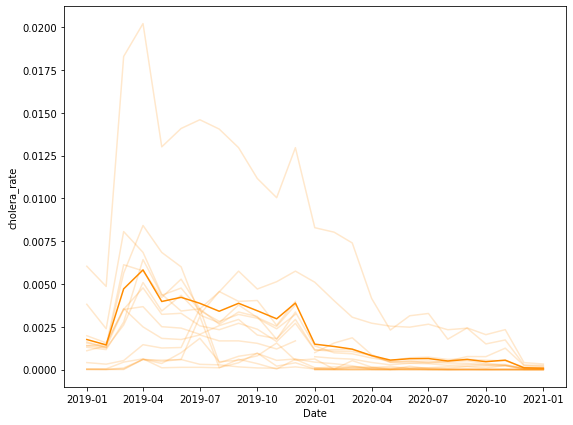

In [45]:
# Clear up columns
charcols = [merged.columns[i] for i in [116,117,119,120,73,67,56,57,58,59,60,61,17]]
valid_cols = set([c for c in merged.columns[5:]]) - set(charcols)
merged_valid = merged.drop(charcols, axis=1)
for c in valid_cols:
    merged_valid[c] = merged_valid[c].astype(float, errors='ignore')

# Plot rate
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9,7))
sns.lineplot(data=merged.groupby('Date')['cholera_rate'].mean().reset_index(),
             x='Date', y='cholera_rate', color='darkorange')
sns.lineplot(data=merged.groupby(['Date', 'Governorate'])['cholera_rate'].mean().reset_index(), 
             x='Date', y='cholera_rate', alpha=.2, legend=False, hue='Governorate', palette=['darkorange']*merged.Governorate.nunique())
plt.show()


### Predict overall numbers

In [46]:
# Do stuff

### Univariate regressions
Here we try to use all numerical predictors in the dataset to predict the number of cases by population unit in each district. None of the predictors individually explain much variance, and even the best predictor produces errors in the scale of thousands of cases per month. <br>
Note that here low predictive performance is likely a combination of intrinsic lack of information in single predictors, but also in the size and quality of the data.

/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:72: FutureWarning: Pass groups=['Abyan' 'Abyan' 'Abyan' ... "Ta'iz" "Ta'iz" "Ta'iz"] as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  "will result in an error", FutureWarning)
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:72: FutureWarning: Pass groups=['Abyan' 'Abyan' 'Abyan' ... "Ta'iz" "Ta'iz" "Ta'iz"] as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  "will result in an error", FutureWarning)
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:72: FutureWarning: Pass groups=['Abyan' 'Abyan' 'Abyan' ... "Ta'iz" "Ta'iz" "Ta'iz"] as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  "will result in an error", FutureWarning)
/Users/rr4839

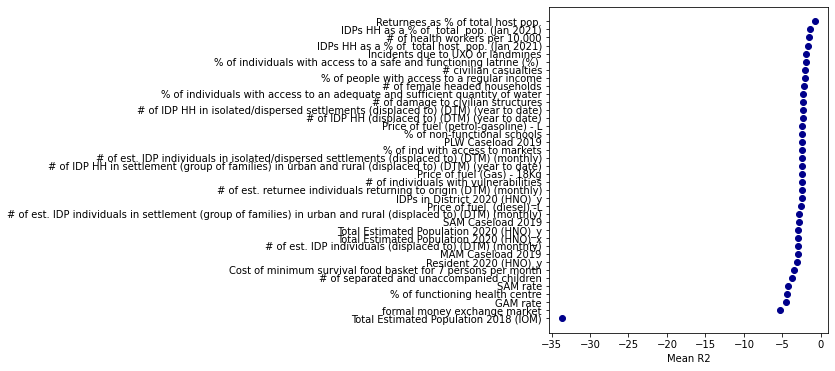

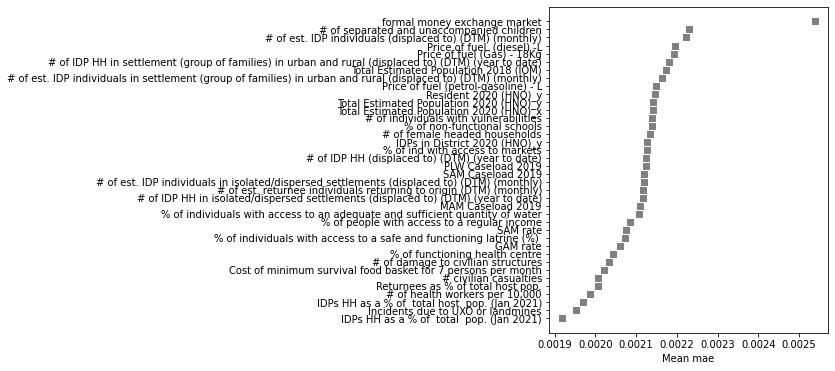

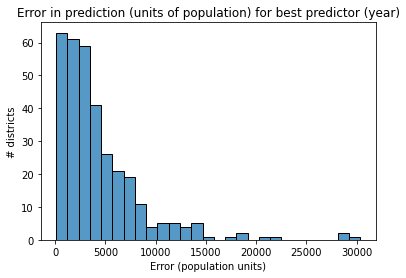

In [47]:
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GroupKFold, cross_validate

# Cross-validated single-predictor predictions (time unaware)
K = 10
cv_mean_r2, cv_sd_r2, cv_mean_mse, cv_mean_mse_train, varlist = [], [], [], [], []
cv_max_mse, cv_max_mse_train = [], []
est_lr = LinearRegression()
gkfolds = GroupKFold(n_splits=K)

predictors = (set(valid_cols) - set(['cholera_rate'])) - set(vdict['baseline'])
predictors = [p for p in predictors if 'cholera' not in p]
for c in predictors:
    if merged_valid[[c, 'cholera_rate', 'Governorate']].dropna().shape[0] > 4000:
        no_nas = merged_valid[[c, 'cholera_rate', 'Governorate']].dropna()
        X = no_nas[c].values.reshape(-1,1)
        y = no_nas['cholera_rate'].values
        grp = no_nas['Governorate'].values
        cv_scores = cross_validate(est_lr, X, y, grp, cv=gkfolds, 
                                    scoring=('r2', 'neg_mean_absolute_error'),
                                    return_train_score=True)
        mean_r2 = cv_scores['test_r2'].mean()
        sd_r2 = cv_scores['test_r2'].std()
        mean_mse = abs(cv_scores['test_neg_mean_absolute_error']).mean()
        mean_mse_train = abs(cv_scores['train_neg_mean_absolute_error']).mean()
        max_mse = abs(cv_scores['test_neg_mean_absolute_error']).max()
        max_mse_train = abs(cv_scores['train_neg_mean_absolute_error']).max()
        
        cv_mean_r2.append(mean_r2)
        cv_sd_r2.append(sd_r2)
        cv_mean_mse.append(mean_mse)
        cv_mean_mse_train.append(mean_mse_train)
        cv_max_mse.append(max_mse)
        cv_max_mse_train.append(max_mse_train)
        varlist.append(c)

summary = pd.DataFrame()
summary['varname'] = varlist
summary['cv_mean_r2'] = cv_mean_r2
summary['cv_sd_r2'] = cv_sd_r2
summary['cv_mean_mse'] = cv_mean_mse
summary['cv_mean_mse_train'] = cv_mean_mse_train
summary['cv_max_mse'] = cv_max_mse
summary['cv_max_mse_train'] = cv_max_mse_train

fig, ax = plt.subplots(figsize=(5,6))
plt.scatter(data=summary.sort_values(by='cv_mean_r2'), 
            y='varname', 
            x='cv_mean_r2',
            color='darkblue')
plt.xlabel('Mean R2')
plt.ylabel('')
plt.show()

fig, ax = plt.subplots(figsize=(5,6))
plt.scatter(data=summary.sort_values(by='cv_mean_mse'), 
             y='varname', 
             x='cv_mean_mse',
             color='grey', 
             marker='s')
plt.xlabel('Mean mae')
plt.ylabel('')
plt.show()

# Make more intuitive plot
mult=summary[summary['varname']=='Returnees as % of total host pop.']['cv_max_mse'].iloc[0]
sns.histplot(baseline['Total Estimated Population 2020 (HNO)'] * mult * 10)
plt.title('Error in prediction (units of population) for best predictor (year)')
plt.xlabel('Error (population units)')
plt.ylabel('# districts')
plt.show()

### ARMA models
These are autoregressive models (for non-seasonal and no-trend data). We use initial points in a time series for each district to try to predict how the number of cases will unfold. Again, models (which are likely even overfitting, really) yield very poor performance, meaning that there is not a lot of information in the time series in terms of the dynamic of the epidemics.

In [48]:
# Use autoregressive model
from statsmodels.tsa.arima_model import ARIMA
# ARIMA - could also try on absolute cases
arima_maes = []
for d in merged_valid.District.unique():
    # Split train and test
    ddf = merged_valid[merged_valid['District']==d].sort_values(by='Date')
    data = ddf['cholera_rate'].tolist()
    train_last = round(len(data)*.7)
    train = data[:train_last]
    test = data[train_last:]
    model = ARIMA(train, order=(2, 0, 1))
    try:
        model_fit = model.fit()
        preds = [model_fit.forecast()[0][0] for _ in test]
        mae = np.max(abs(np.array(test) - preds))
        arima_maes.append({'District': d, 'MAE': mae})
    except:
        arima_maes.append({'District': d, 'MAE': np.nan})
arima_df = pd.DataFrame(arima_maes)
arima_df = arima_df.merge(merged_valid[['District', 'Total Estimated Population 2020 (HNO)_y']].groupby('District').max().reset_index())

/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/ar_model.py:763: RuntimeWarning: divide by zero encountered in log
  return np.log(self.sigma2) + (1 + self.df_model) * np.log(nobs)/nobs
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(

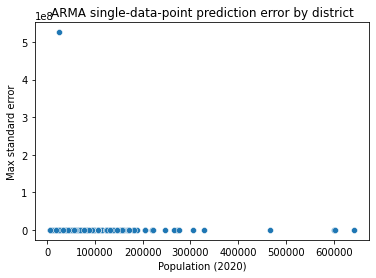

In [49]:
# Plot max error per population
sns.scatterplot(x=arima_df['Total Estimated Population 2020 (HNO)_y'],
                y=arima_df['MAE'])
plt.xlabel('Population (2020)')
plt.ylabel('Max standard error')
plt.title('ARMA single-data-point prediction error by district')
plt.show()


In [50]:
print(arima_df['Total Estimated Population 2020 (HNO)_y'].iloc[118])
print(arima_df['Total Estimated Population 2020 (HNO)_y'].iloc[96])
print(arima_df['Total Estimated Population 2020 (HNO)_y'].iloc[86])

140078.81494109528
204723.72091794945
161382.97875857883


In [51]:
(arima_df['MAE'] * arima_df['Total Estimated Population 2020 (HNO)_y'] * 12).sort_values(ascending=False)[:4].tolist()

[157053918846986.47, 11983.792806996487, 6441.184889043825, 4122.738636105081]

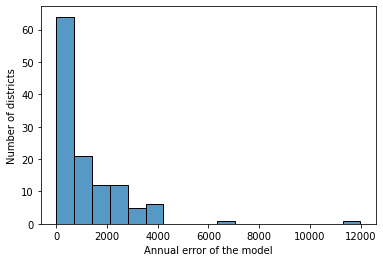

In [52]:
vals = (arima_df['MAE'] * arima_df['Total Estimated Population 2020 (HNO)_y'] * 12).sort_values(ascending=False)[1:].tolist()
sns.histplot(vals)
plt.xlabel('Annual error of the model')
plt.ylabel('Number of districts')
plt.show()

### Multivariate (in progress)
To be honest, univariate modeling is rather unfair: how can you expect a single, non-temporally informative predictor, to predict cholera cases at any time in any district? If such prediction is possible with traditional estimation methods, it is likely to require multivariate modeling (and, possibly, multivariate + autoregressive models). Below, we try to look into how well a multivariate model could do on this data. We first do feature selection through LASSO to identify a set of likely useful predictors, then use those to predict cholera rates.

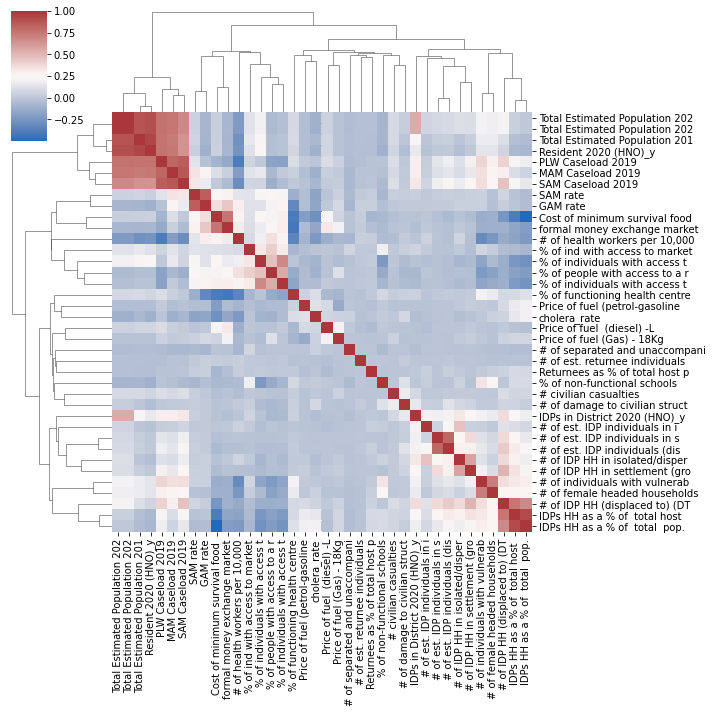

In [53]:
# Best predictors estimations
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
imputer = SimpleImputer(strategy='mean')
nuls = merged_valid.isnull().sum() / merged_valid.shape[0]
merged_filtered = merged_valid.drop([c for c in nuls[nuls>.1].index], axis=1)
merged_filtered = merged_filtered[list(set(predictors) & set(merged_filtered.columns)) + ['cholera_rate']]
merged_filtered.drop(['Total Estimated Population 2020 (HNO)_y',
                      'Resident 2020 (HNO)_y',
                      'IDPs in District 2020 (HNO)_y'], axis=1)
vals = MinMaxScaler().fit_transform(imputer.fit_transform(merged_filtered))
merged_filtered = pd.DataFrame(vals, columns=merged_filtered.columns)
merged_filtered.columns = [c[:30] for c in merged_filtered]
sns.clustermap(merged_filtered.corr(), cmap='vlag')

In [133]:
from sklearn.linear_model import Lasso 
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import KFold

lr = Lasso(alpha=.0002).fit(merged_filtered.drop(['cholera_rate'], axis=1).values, 
                            merged_filtered['cholera_rate']) # consider adding lag
model = SelectFromModel(lr, prefit=True)
X_new = model.transform(merged_filtered.drop(['cholera_rate'], axis=1).values)
y = merged_filtered['cholera_rate']
kfolds = KFold(10)
cv_scores = cross_validate(est_lr, X_new, y, cv=kfolds, 
                        scoring=('r2', 'neg_mean_absolute_error'),
                        return_train_score=True)
print(cv_scores['train_r2'].mean(), cv_scores['test_r2'].mean())

0.1617912568262043 -0.8291599387483156


Note that adding a lag does not change performance in the univariate, nor in the multivariate contexts.

### Autoregressive models with covariates

In [196]:
from statsmodels.tsa.statespace.varmax import VARMAX
varmax_maes = []
for d in merged_valid.District.unique():

    ddf = merged_valid[merged_valid['District']==d].sort_values(by='Date')
    x = X_new[ddf.index, :]
    y = ddf['cholera_rate'].tolist()
    train_last = round(len(y)*.7)
    train_y = np.array(y[:train_last])
    test_y = np.array(y[train_last:])
    train_x = x[:train_last,:]
    test_x = x[train_last:,:]
    no_constant_cols = np.where(~np.all(train_x[1:] == train_x[:-1], axis=0))[0]
    no_constant_train = train_x[:, no_constant_cols]
    no_constant_test = test_x[:, no_constant_cols]
    #constant_train = train_x[:, np.all(train_x[1:] == train_x[:-1], axis=0)]
    #constant_test = test_x[:, np.all(test_x[1:] == test_x[:-1], axis=0)]
    model = ARIMA(endog=train_y, exog=no_constant_train, order=(2, 0, 1))
    try:
        model_fit = model.fit()
        preds = [model_fit.forecast(exog=no_constant_test[ix,:])[0][0] for ix, _ in enumerate(test_y)] # exog
        mae = np.max(abs(np.array(test_y) - preds))
        varmax_maes.append({'District': d, 'MAE': mae})
    except:
        varmax_maes.append({'District': d, 'MAE': np.nan})
varmax_df = pd.DataFrame(varmax_maes)
varmax_df = varmax_df.merge(merged_valid[['District', 
                                          'Total Estimated Population 2020 (HNO)_y']].groupby('District').max().reset_index())


/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params 

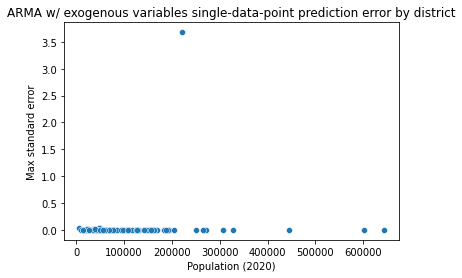

In [203]:
# Plot max error per population
sns.scatterplot(x=varmax_df['Total Estimated Population 2020 (HNO)_y'],
                y=varmax_df['MAE'])
plt.xlabel('Population (2020)')
plt.ylabel('Max standard error')
plt.title('ARMA w/ exogenous variables single-data-point prediction error by district')
plt.show()


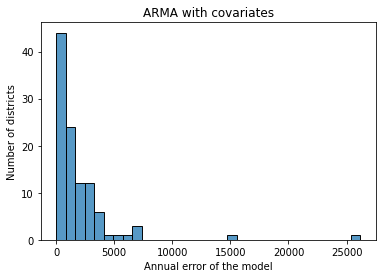

In [202]:
vals = (varmax_df['MAE'] * varmax_df['Total Estimated Population 2020 (HNO)_y'] * 12).sort_values(ascending=False)[1:].tolist()
sns.histplot(vals)
plt.title('ARMA with covariates')
plt.xlabel('Annual error of the model')
plt.ylabel('Number of districts')
plt.show()

### Look into simple correlations at aggregate level

In [413]:
merged_grouped = merged_valid.groupby('District').mean().reset_index()

cdict = []
for p in set(predictors) - set(['%Attack rate ', '# of suspected cases - cholera', 'cholera_death_rate']) :
    try:
        ss = merged_grouped[[p, 'cholera_rate']].dropna()
        X = ss[p].astype(float, errors='ignore').values
        y = ss['cholera_rate'].values
        val, pval = pearsonr(X, y)
        cdict.append((p, round(val, 5), round(pval, 5)))
    except:
        print(p)

Principal Impediments
# of returnee HH returning to origin (DTM) (2019 total)
# of returnee HH returning to origin (DTM) (2018 total)
Unnamed: 12
# of returnee HH returning to origin (DTM) (2020 total)
Type of critical infrastructure damaged 
# of IDP HH (displaced to) (DTM) (2018 total)


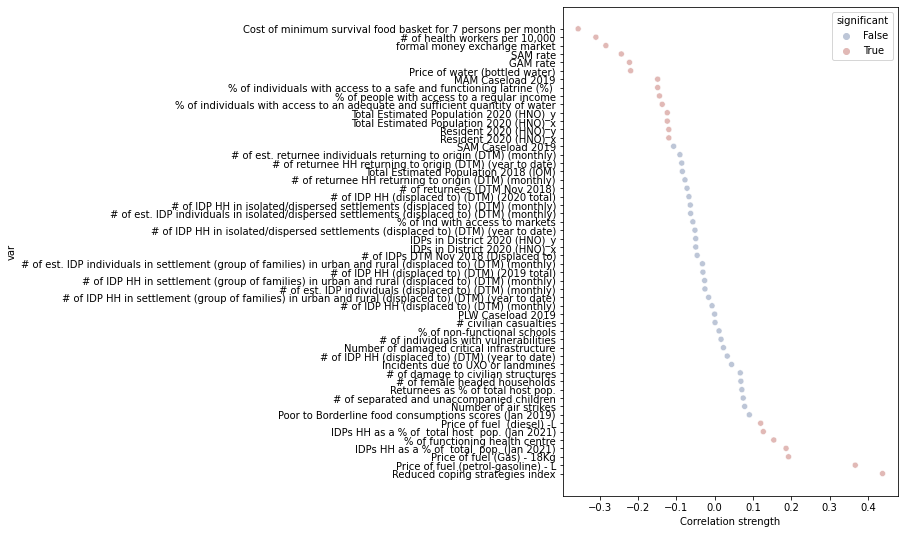

In [414]:
data = pd.DataFrame(cdict, columns=['var', 'val', 'pval']).sort_values(by='val')
data['significant'] = data['pval'] < 0.05
fig, ax = plt.subplots(figsize=(6,9))
sns.scatterplot(data=data, x='val', y='var', hue='significant', palette='vlag')
plt.xlabel('Correlation strength')
plt.show()

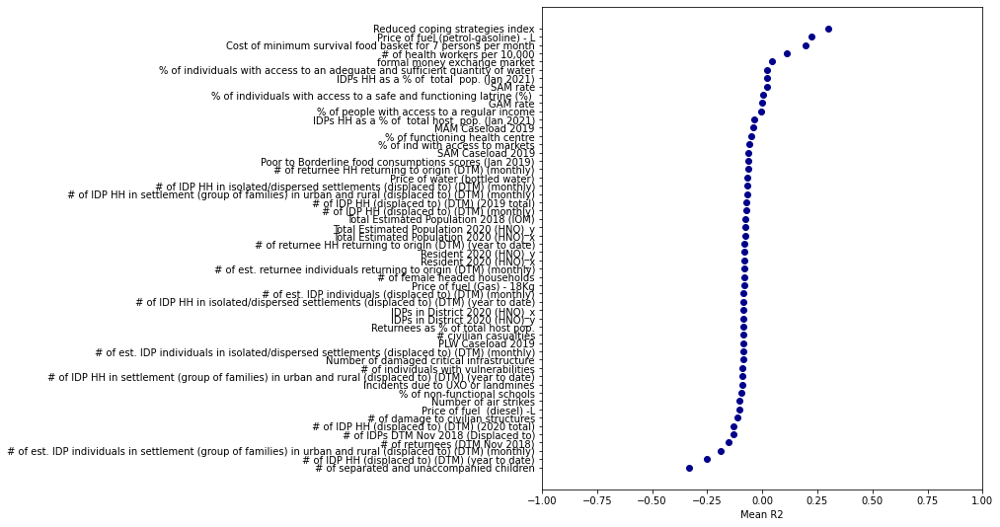

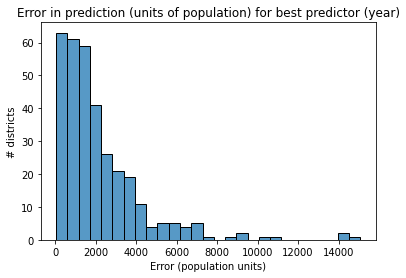

In [416]:
cv_mean_r2, cv_sd_r2, cv_mean_mse, cv_mean_mse_train, varlist = [], [], [], [], []
cv_max_mse, cv_max_mse_train = [], []

for p in set(predictors) - set(['%Attack rate ', '# of suspected cases - cholera', 'cholera_death_rate']) :
    try:
        ss = merged_grouped[[p, 'cholera_rate']].dropna()
        X = ss[p].astype(float, errors='ignore').values.reshape(-1,1)
        y = ss['cholera_rate'].values
        cv_scores = cross_validate(est_lr, X, y, cv=kfolds, 
                                    scoring=('r2', 'neg_mean_absolute_error'),
                                    return_train_score=True)
        mean_r2 = cv_scores['test_r2'].mean()
        sd_r2 = cv_scores['test_r2'].std()
        mean_mse = abs(cv_scores['test_neg_mean_absolute_error']).mean()
        mean_mse_train = abs(cv_scores['train_neg_mean_absolute_error']).mean()
        max_mse = abs(cv_scores['test_neg_mean_absolute_error']).max()
        max_mse_train = abs(cv_scores['train_neg_mean_absolute_error']).max()
        
        cv_mean_r2.append(mean_r2)
        cv_sd_r2.append(sd_r2)
        cv_mean_mse.append(mean_mse)
        cv_mean_mse_train.append(mean_mse_train)
        cv_max_mse.append(max_mse)
        cv_max_mse_train.append(max_mse_train)
        varlist.append(p)
    except:
        pass

summary = pd.DataFrame()
summary['varname'] = varlist
summary['cv_mean_r2'] = cv_mean_r2
summary['cv_sd_r2'] = cv_sd_r2
summary['cv_mean_mse'] = cv_mean_mse
summary['cv_mean_mse_train'] = cv_mean_mse_train
summary['cv_max_mse'] = cv_max_mse
summary['cv_max_mse_train'] = cv_max_mse_train

fig, ax = plt.subplots(figsize=(8,9))
plt.scatter(data=summary.sort_values(by='cv_mean_r2'), 
            y='varname', 
            x='cv_mean_r2',
            color='darkblue')
plt.xlim(-1,1)
plt.xlabel('Mean R2')
plt.ylabel('')
plt.show()

# Make more intuitive plot
mult=summary[summary['varname']=='Returnees as % of total host pop.']['cv_max_mse'].iloc[0]
sns.histplot(baseline['Total Estimated Population 2020 (HNO)'] * mult * 10)
plt.title('Error in prediction (units of population) for best predictor (year)')
plt.xlabel('Error (population units)')
plt.ylabel('# districts')
plt.show()

In [433]:
lr = Lasso(alpha=.0002).fit(merged_grouped.dropna(axis=1).drop(['cholera_rate', 'District'], axis=1).values, 
                            merged_grouped.dropna(axis=1)['cholera_rate']) # consider adding lag
model = SelectFromModel(lr, prefit=True)
X_new = model.transform(merged_grouped.dropna(axis=1).drop(['cholera_rate', 'District'], axis=1).values)
y = merged_grouped.dropna(axis=1)['cholera_rate']
cv_scores = cross_validate(est_lr, X_new, y, cv=kfolds, 
                        scoring=('r2', 'neg_mean_absolute_error'),
                        return_train_score=True)
print(cv_scores['train_r2'].mean(), cv_scores['test_r2'].mean())

0.3424163104030044 0.43487621849004243
/Users/rr48396/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.000749957918490549, tolerance: 2.653013298662849e-07
  positive)


... at aggregate level we do a bit better, both on univariate and on the multivariat case. 
We get the illusion that we can predict stuff. But is this usable for prediction and forecasting? Almost not at all!

### Does PCA univariate do any better?

In [400]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
X_scaled = MinMaxScaler().fit_transform(merged_filtered.drop('cholera_rate', axis=1).values)
pca = PCA()
pca.fit(X_scaled)

PCA()

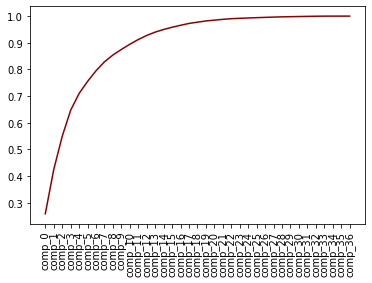

In [401]:
sns.lineplot(x=['comp_' + str(i) for i in range(len(pca.explained_variance_ratio_))], 
            y=pd.Series(pca.explained_variance_ratio_).cumsum(), color='darkred')
plt.xticks(rotation=90)
plt.show()

In [402]:
compdf = pd.DataFrame(pca.components_, columns=merged_filtered.drop('cholera_rate', axis=1).columns)

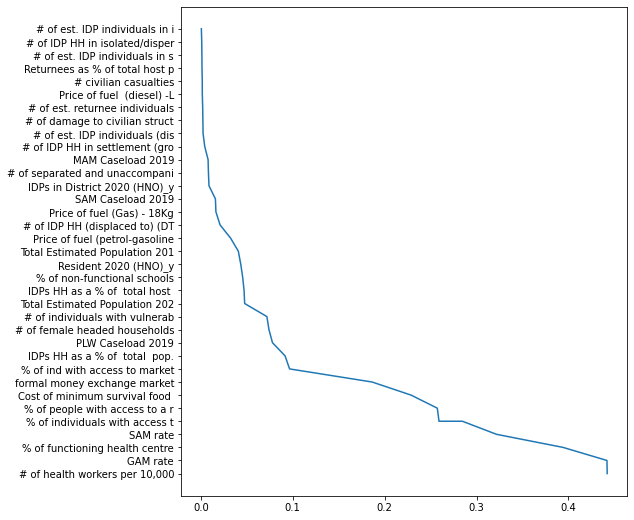

In [403]:
plt.subplots(figsize=(8,9))
sns.lineplot(y=abs(compdf.T.iloc[:,0]).sort_values().index, 
             x=abs(compdf.T.iloc[:,0]).sort_values().values)
plt.show()

### Transform and predict

In [406]:
X_pca = np.dot(X_scaled, pca.components_)
X_pca = pd.DataFrame(X_pca, columns=[f'comp_{str(i)}' for i in range(X_pca.shape[1])])
X_pca['cholera_rate'] = merged_filtered['cholera_rate']

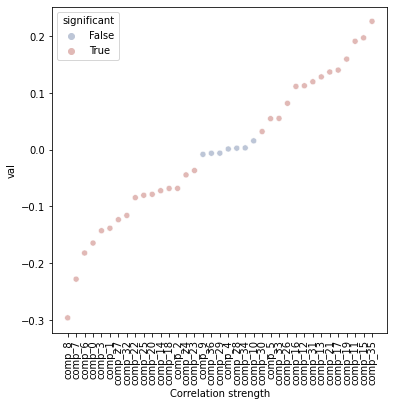

In [411]:
cdict = []
for p in X_pca.drop('cholera_rate', axis=1).columns:
    try:
        ss = X_pca[[p, 'cholera_rate']].dropna()
        X = ss[p].astype(float, errors='ignore').values
        y = ss['cholera_rate'].values
        val, pval = pearsonr(X, y)
        cdict.append((p, round(val, 5), round(pval, 5)))
    except:
        print(p)

data = pd.DataFrame(cdict, columns=['var', 'val', 'pval']).sort_values(by='val')
data['significant'] = data['pval'] < 0.05
fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=data, y='val', x='var', hue='significant', palette='vlag')
plt.xlabel('Correlation strength')
plt.xticks(rotation=90)
plt.show()

In [ ]:
cv_mean_r2, cv_sd_r2, cv_mean_mse, cv_mean_mse_train, varlist = [], [], [], [], []
cv_max_mse, cv_max_mse_train = [], []

for p in set(X_pca.columns) - set(['cholera_rate']) :
    try:
        ss = X_pca[[p, 'cholera_rate']].dropna()
        X = ss[p].astype(float, errors='ignore').values.reshape(-1,1)
        y = ss['cholera_rate'].values
        cv_scores = cross_validate(est_lr, X, y, cv=kfolds, 
                                    scoring=('r2', 'neg_mean_absolute_error'),
                                    return_train_score=True)
        mean_r2 = cv_scores['test_r2'].mean()
        sd_r2 = cv_scores['test_r2'].std()
        mean_mse = abs(cv_scores['test_neg_mean_absolute_error']).mean()
        mean_mse_train = abs(cv_scores['train_neg_mean_absolute_error']).mean()
        max_mse = abs(cv_scores['test_neg_mean_absolute_error']).max()
        max_mse_train = abs(cv_scores['train_neg_mean_absolute_error']).max()
        
        cv_mean_r2.append(mean_r2)
        cv_sd_r2.append(sd_r2)
        cv_mean_mse.append(mean_mse)
        cv_mean_mse_train.append(mean_mse_train)
        cv_max_mse.append(max_mse)
        cv_max_mse_train.append(max_mse_train)
        varlist.append(p)
    except:
        pass

summary = pd.DataFrame()
summary['varname'] = varlist
summary['cv_mean_r2'] = cv_mean_r2
summary['cv_sd_r2'] = cv_sd_r2
summary['cv_mean_mse'] = cv_mean_mse
summary['cv_mean_mse_train'] = cv_mean_mse_train
summary['cv_max_mse'] = cv_max_mse
summary['cv_max_mse_train'] = cv_max_mse_train

fig, ax = plt.subplots(figsize=(5,6))
plt.scatter(data=summary.sort_values(by='cv_mean_r2'), 
            y='varname', 
            x='cv_mean_r2',
            color='darkblue')
plt.xlim(-1,1)
plt.xlabel('Mean R2')
plt.ylabel('')
plt.show()


... not really. There are alternative options. Looking at causal models is one example. Here, we don't just blindly try to estimate correlation, but we add some idea of which variables cause each other. With this amount of data, though, it is unlikely that we can estimate any reasonably good model. You can in fact make the point that models that are just as unreasonable receive the same level of support from the data. That's why we need to turn to hypothesis driven models, at least until we can gather data which are good enough.


In [ ]:
# Do dummy causal model?
# Integrate more datasets, e.g.: Missing information:
    # Population density
    # Infrastructure classification